In [1]:
# ============================
# 0. IMPORTS & CONFIG
# ============================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

# !pip install -q kaggle tensorflow_addons

import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import load_img, img_to_array

print("TF version:", tf.__version__)
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

# --------- CONFIGURABLE PARAMETERS ---------
IMG_SIZE        = 64            # resize images to 64x64
CHANNELS        = 3             # *** RGB ***
LATENT_DIM      = 100           # size of noise vector for GAN
BATCH_SIZE      = 64            # training batch size
EPOCHS_GAN      = 90            # epochs for GAN
EPOCHS_CNN      = 15            # epochs for classifier
LR_GAN          = 0.0002        # learning rate for GAN
LR_CNN          = 0.0003        # learning rate for classifier
N_SYNTH_PER_CLASS = 800         # synthetic images per class

# Paths
DATA_DIR   = "/content/ham10000"
META_CSV   = f"{DATA_DIR}/HAM10000_metadata.csv"
IMG_DIR_1  = f"{DATA_DIR}/HAM10000_images_part_1"
IMG_DIR_2  = f"{DATA_DIR}/HAM10000_images_part_2"
IMG_DIR_1L = f"{DATA_DIR}/ham10000_images_part_1"
IMG_DIR_2L = f"{DATA_DIR}/ham10000_images_part_2"


TF version: 2.19.0
Num GPUs Available: 1


In [2]:
# Install Kaggle API
!pip install kaggle -q

# Upload kaggle.json
!mkdir -p ~/.kaggle
!cp /content/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download dataset
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

# Unzip
!unzip skin-cancer-mnist-ham10000.zip -d ham10000


Streaming output truncated to the last 5000 lines.
  inflating: ham10000/ham10000_images_part_2/ISIC_0029325.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029326.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029327.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029328.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029329.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029330.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029331.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029332.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029333.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029334.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029335.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029336.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029337.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_0029338.jpg  
  inflating: ham10000/ham10000_images_part_2/ISIC_002

     lesion_id      image_id   dx dx_type   age   sex localization
0  HAM_0000118  ISIC_0027419  bkl   histo  80.0  male        scalp
1  HAM_0000118  ISIC_0025030  bkl   histo  80.0  male        scalp
2  HAM_0002730  ISIC_0026769  bkl   histo  80.0  male        scalp
3  HAM_0002730  ISIC_0025661  bkl   histo  80.0  male        scalp
4  HAM_0001466  ISIC_0031633  bkl   histo  75.0  male          ear
Total images with valid files: 10015
Classes: ['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']


Loading images: 100%|██████████| 10015/10015 [01:26<00:00, 116.04it/s]


Image array shape: (10015, 64, 64, 3)
Labels shape: (10015,)
Train: (7235, 64, 64, 3) Val: (1277, 64, 64, 3) Test: (1503, 64, 64, 3)


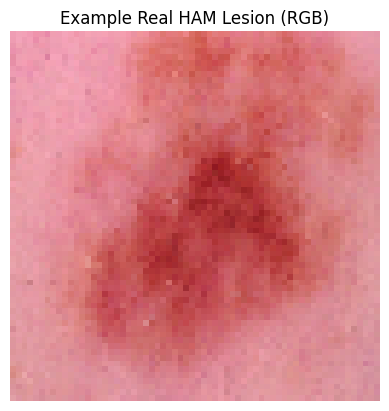

In [3]:
# ============================
# 1. LOAD & PREPROCESS HAM10000
# ============================

# Load metadata (contains 'image_id' and 'dx' columns)
meta = pd.read_csv(META_CSV)
print(meta.head())

# Map each image_id to an actual JPG path
def resolve_path(img_id):
    fname = img_id + ".jpg"
    candidates = [
        os.path.join(IMG_DIR_1,  fname),
        os.path.join(IMG_DIR_2,  fname),
        os.path.join(IMG_DIR_1L, fname),
        os.path.join(IMG_DIR_2L, fname),
    ]
    for p in candidates:
        if os.path.exists(p):
            return p
    return None

meta["filepath"] = meta["image_id"].apply(resolve_path)
meta = meta.loc[meta["filepath"].notnull()].copy()
print("Total images with valid files:", len(meta))

# Encode labels (diagnosis) as integers
label_enc = LabelEncoder()
meta["label_idx"] = label_enc.fit_transform(meta["dx"])
num_classes = len(label_enc.classes_)
print("Classes:", label_enc.classes_)

# Utility: load, resize, keep RGB, normalize to [0,1]
def load_and_preprocess(path, img_size=IMG_SIZE):
    img = load_img(path, target_size=(img_size, img_size))  # RGB by default
    img = img_to_array(img) / 255.0                         # (H, W, 3)
    return img

# Load all images into memory
images = []
labels = []

for _, row in tqdm(meta.iterrows(), total=len(meta), desc="Loading images"):
    img = load_and_preprocess(row["filepath"])
    images.append(img)
    labels.append(row["label_idx"])

images = np.array(images, dtype="float32")   # (N, 64, 64, 3)
labels = np.array(labels, dtype="int32")

print("Image array shape:", images.shape)
print("Labels shape:", labels.shape)

# Train / Val / Test split (stratified by label)
X_temp, X_test, y_temp, y_test = train_test_split(
    images, labels, test_size=0.15, random_state=42, stratify=labels
)

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.15, random_state=42, stratify=y_temp
)

print("Train:", X_train.shape, "Val:", X_val.shape, "Test:", X_test.shape)

# Optional sanity check
plt.imshow(X_train[0])
plt.axis("off")
plt.title("Example Real HAM Lesion (RGB)")
plt.show()


In [4]:
# ==========================================
# 2. BUILD DCGAN: GENERATOR & DISCRIMINATOR
# ==========================================

IMG_SHAPE = (IMG_SIZE, IMG_SIZE, CHANNELS)  # (64,64,3)

# --------- GENERATOR ---------
def build_generator(latent_dim=LATENT_DIM):
    model = models.Sequential(name="Generator")
    model.add(layers.Input(shape=(latent_dim,)))

    # Dense -> 8x8x256 feature map
    model.add(layers.Dense(8 * 8 * 256))
    model.add(layers.ReLU())
    model.add(layers.Reshape((8, 8, 256)))   # (8, 8, 256)

    # 8x8 -> 16x16
    model.add(layers.UpSampling2D(size=2))
    model.add(layers.Conv2D(128, kernel_size=3, padding="same"))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # 16x16 -> 32x32
    model.add(layers.UpSampling2D(size=2))
    model.add(layers.Conv2D(64, kernel_size=3, padding="same"))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # 32x32 -> 64x64, RGB output
    model.add(layers.UpSampling2D(size=2))
    model.add(layers.Conv2D(CHANNELS, kernel_size=3, padding="same"))
    model.add(layers.Activation("tanh"))  # output in [-1,1]

    return model

# --------- DISCRIMINATOR ---------
def build_discriminator(input_shape=IMG_SHAPE):
    model = models.Sequential(name="Discriminator")
    model.add(layers.Input(shape=input_shape))

    # 64x64 -> 32x32
    model.add(layers.Conv2D(64, kernel_size=4, strides=2, padding="same"))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Dropout(0.3))

    # 32x32 -> 16x16
    model.add(layers.Conv2D(128, kernel_size=4, strides=2, padding="same"))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Dropout(0.3))

    # 16x16 -> 8x8
    model.add(layers.Conv2D(256, kernel_size=4, strides=2, padding="same"))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation="sigmoid"))  # probability real vs fake

    return model

generator     = build_generator()
discriminator = build_discriminator()

# ---- separate optimizers ----
opt_d = optimizers.Adam(learning_rate=LR_GAN * 0.5, beta_1=0.5)  # D a bit slower
opt_g = optimizers.Adam(learning_rate=LR_GAN,       beta_1=0.5)  # G a bit faster

# 1) compile discriminator alone
discriminator.trainable = True
discriminator.compile(
    optimizer=opt_d,
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

# 2) build combined GAN (G + frozen D)
discriminator.trainable = False
z        = layers.Input(shape=(LATENT_DIM,))
fake_img = generator(z)
validity = discriminator(fake_img)
gan      = models.Model(z, validity, name="DCGAN")
gan.compile(optimizer=opt_g, loss="binary_crossentropy")

generator.summary()
discriminator.summary()


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16384)          │     1,654,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 16, 16, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 3)      │         1,731 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 64, 64, 3)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,026,115 (7.73 MB)

 Trainable params: 2,025,731 (7.73 MB)

 Non-trainable params: 384 (1.50 KB)

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 8, 8, 256)      │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        16,385 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 675,265 (2.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 675,265 (2.58 MB)

[1/90] D loss: 0.3819 | G loss: 0.3461


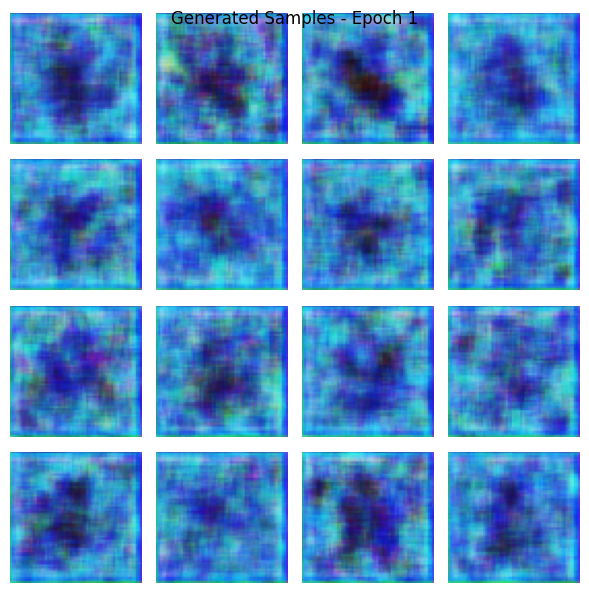

[2/90] D loss: 0.4901 | G loss: 0.5028
[3/90] D loss: 0.5223 | G loss: 0.5244
[4/90] D loss: 0.5617 | G loss: 0.5352
[5/90] D loss: 0.5895 | G loss: 0.5503


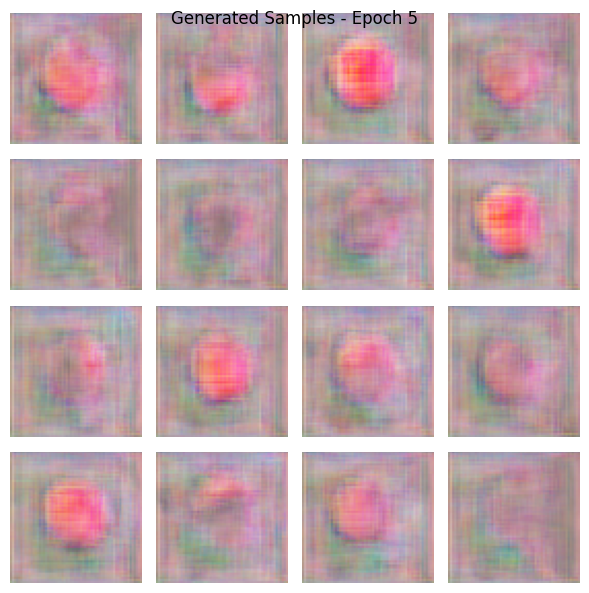

[6/90] D loss: 0.6072 | G loss: 0.5659
[7/90] D loss: 0.6118 | G loss: 0.5607
[8/90] D loss: 0.6194 | G loss: 0.5610
[9/90] D loss: 0.6175 | G loss: 0.5477
[10/90] D loss: 0.5987 | G loss: 0.5272


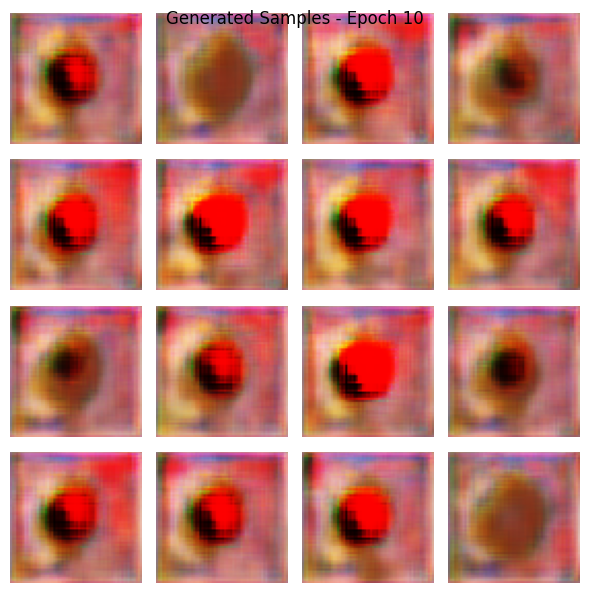

[11/90] D loss: 0.5981 | G loss: 0.5160
[12/90] D loss: 0.5969 | G loss: 0.5077
[13/90] D loss: 0.5842 | G loss: 0.4959
[14/90] D loss: 0.5759 | G loss: 0.4873
[15/90] D loss: 0.5706 | G loss: 0.4786


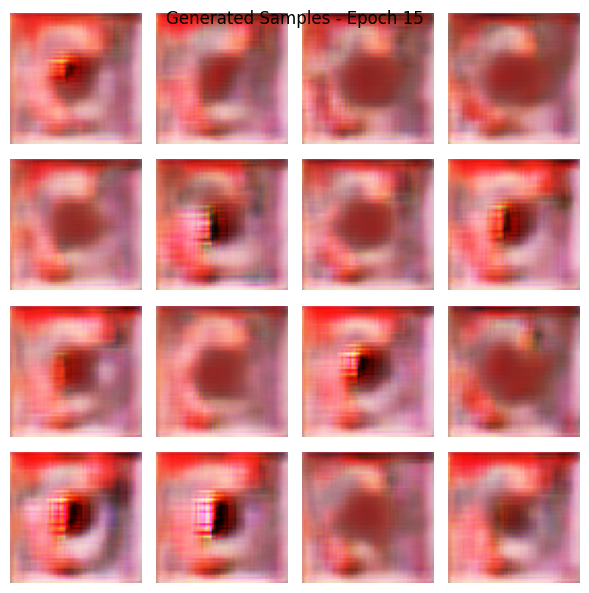

[16/90] D loss: 0.5655 | G loss: 0.4733
[17/90] D loss: 0.5646 | G loss: 0.4695
[18/90] D loss: 0.5644 | G loss: 0.4668
[19/90] D loss: 0.5644 | G loss: 0.4661
[20/90] D loss: 0.5621 | G loss: 0.4620


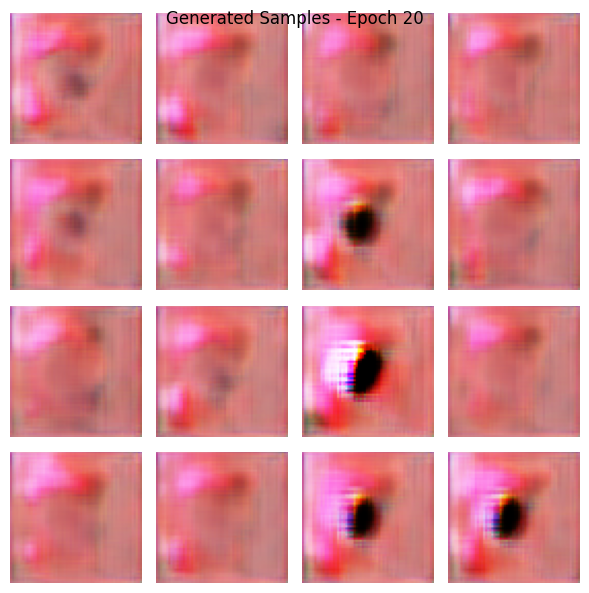

[21/90] D loss: 0.5632 | G loss: 0.4591
[22/90] D loss: 0.5656 | G loss: 0.4607
[23/90] D loss: 0.5658 | G loss: 0.4613
[24/90] D loss: 0.5670 | G loss: 0.4639
[25/90] D loss: 0.5649 | G loss: 0.4606


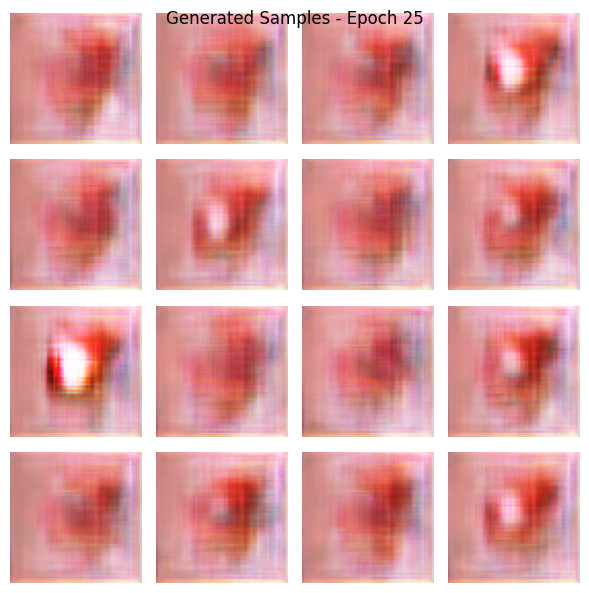

[26/90] D loss: 0.5623 | G loss: 0.4577
[27/90] D loss: 0.5601 | G loss: 0.4566
[28/90] D loss: 0.5631 | G loss: 0.4590
[29/90] D loss: 0.5662 | G loss: 0.4668
[30/90] D loss: 0.5663 | G loss: 0.4709


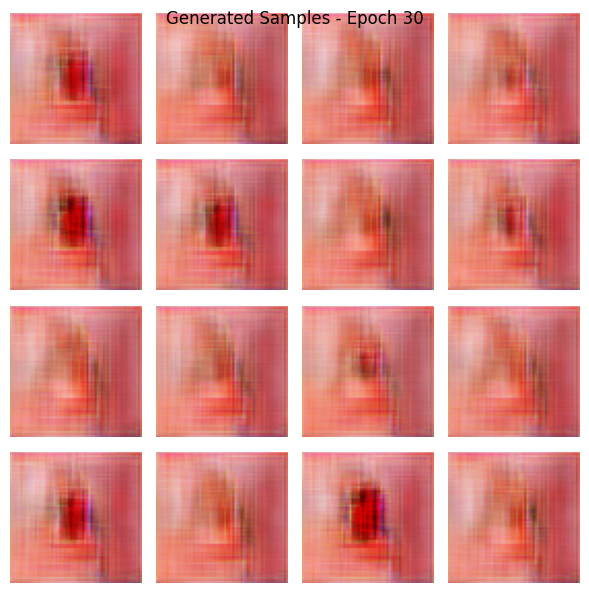

[31/90] D loss: 0.5692 | G loss: 0.4795
[32/90] D loss: 0.5710 | G loss: 0.4871
[33/90] D loss: 0.5711 | G loss: 0.4908
[34/90] D loss: 0.5738 | G loss: 0.4976
[35/90] D loss: 0.5748 | G loss: 0.5053


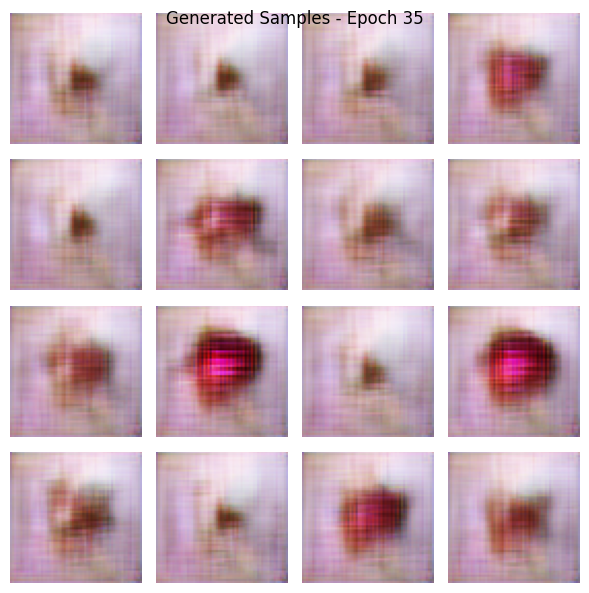

[36/90] D loss: 0.5758 | G loss: 0.5096
[37/90] D loss: 0.5763 | G loss: 0.5153
[38/90] D loss: 0.5767 | G loss: 0.5188
[39/90] D loss: 0.5768 | G loss: 0.5191
[40/90] D loss: 0.5766 | G loss: 0.5206


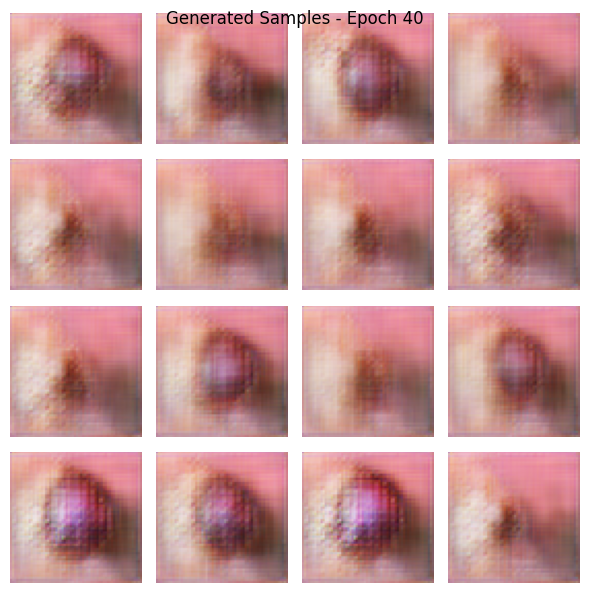

[41/90] D loss: 0.5766 | G loss: 0.5227
[42/90] D loss: 0.5780 | G loss: 0.5245
[43/90] D loss: 0.5804 | G loss: 0.5287
[44/90] D loss: 0.5812 | G loss: 0.5317
[45/90] D loss: 0.5815 | G loss: 0.5343


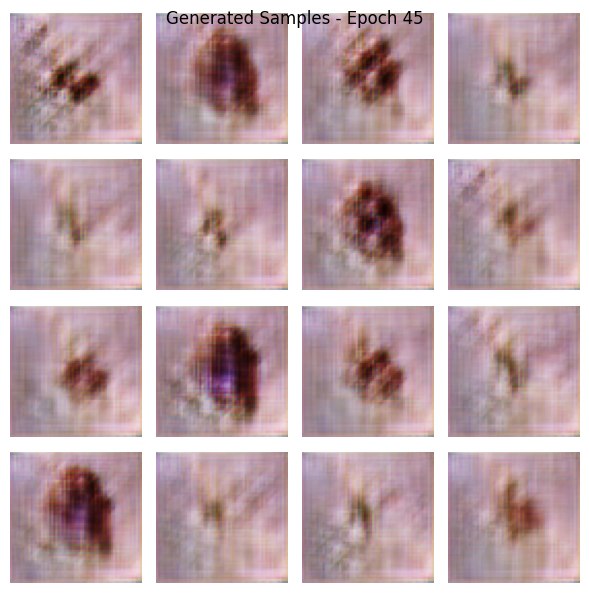

[46/90] D loss: 0.5830 | G loss: 0.5373
[47/90] D loss: 0.5831 | G loss: 0.5385
[48/90] D loss: 0.5836 | G loss: 0.5431
[49/90] D loss: 0.5835 | G loss: 0.5465
[50/90] D loss: 0.5844 | G loss: 0.5511


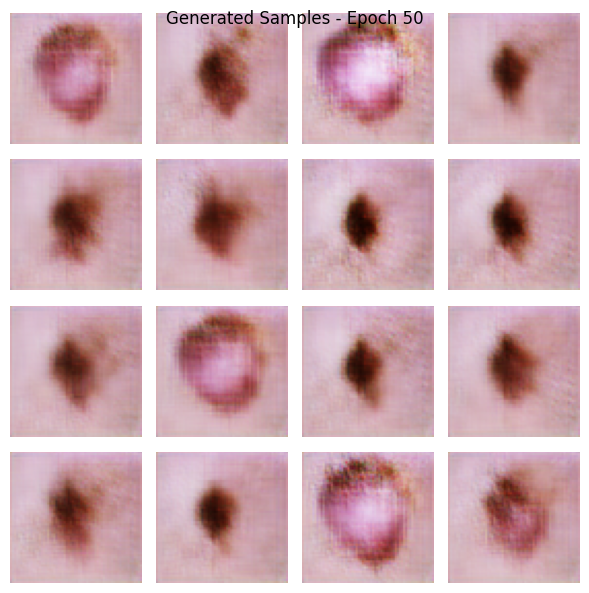

[51/90] D loss: 0.5829 | G loss: 0.5509
[52/90] D loss: 0.5820 | G loss: 0.5520
[53/90] D loss: 0.5803 | G loss: 0.5517
[54/90] D loss: 0.5795 | G loss: 0.5515
[55/90] D loss: 0.5770 | G loss: 0.5496


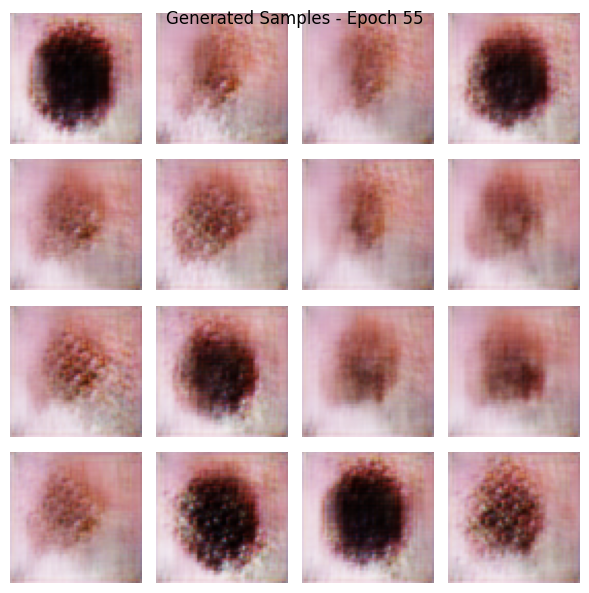

[56/90] D loss: 0.5756 | G loss: 0.5474
[57/90] D loss: 0.5732 | G loss: 0.5456
[58/90] D loss: 0.5714 | G loss: 0.5443
[59/90] D loss: 0.5696 | G loss: 0.5422
[60/90] D loss: 0.5689 | G loss: 0.5418


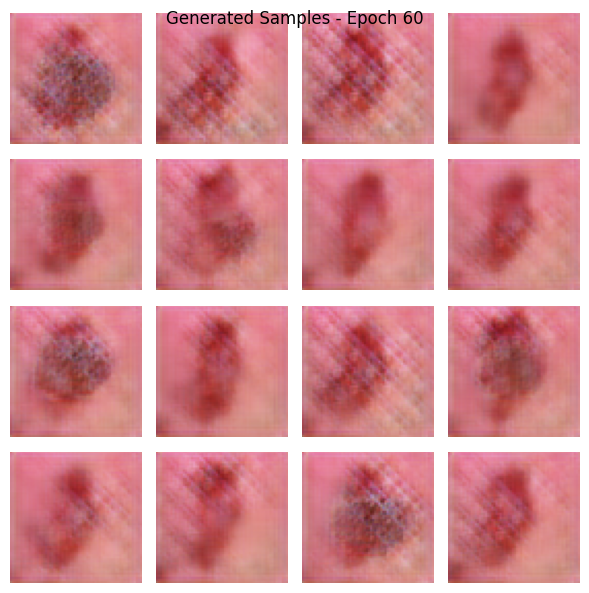

[61/90] D loss: 0.5672 | G loss: 0.5403
[62/90] D loss: 0.5672 | G loss: 0.5415
[63/90] D loss: 0.5661 | G loss: 0.5414
[64/90] D loss: 0.5663 | G loss: 0.5429
[65/90] D loss: 0.5657 | G loss: 0.5433


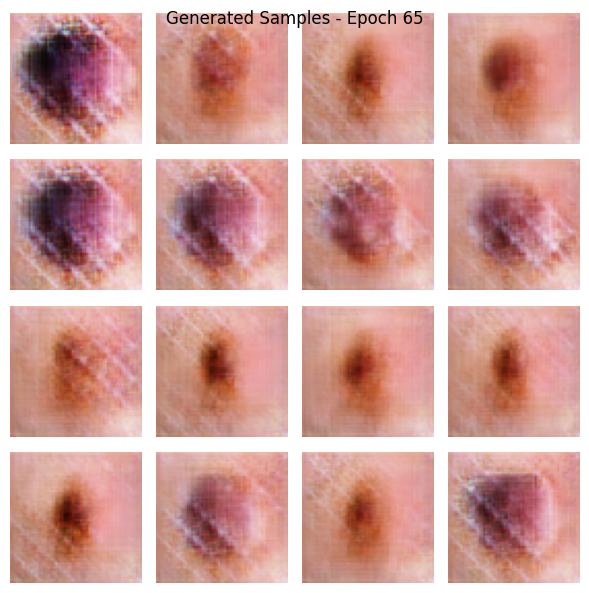

[66/90] D loss: 0.5646 | G loss: 0.5433
[67/90] D loss: 0.5635 | G loss: 0.5430
[68/90] D loss: 0.5614 | G loss: 0.5403
[69/90] D loss: 0.5614 | G loss: 0.5406
[70/90] D loss: 0.5611 | G loss: 0.5406


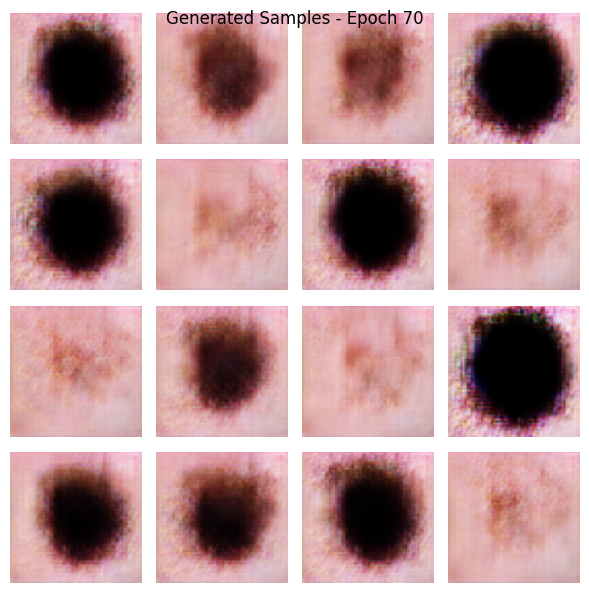

[71/90] D loss: 0.5612 | G loss: 0.5410
[72/90] D loss: 0.5602 | G loss: 0.5397
[73/90] D loss: 0.5592 | G loss: 0.5381
[74/90] D loss: 0.5580 | G loss: 0.5366
[75/90] D loss: 0.5588 | G loss: 0.5389


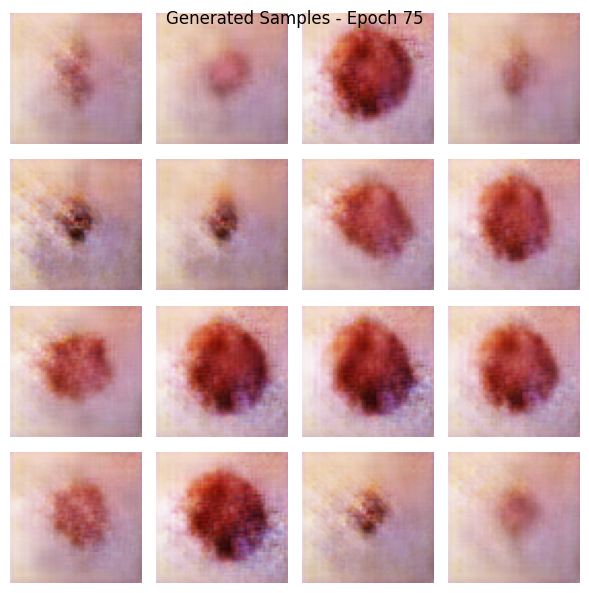

[76/90] D loss: 0.5580 | G loss: 0.5385
[77/90] D loss: 0.5568 | G loss: 0.5375
[78/90] D loss: 0.5571 | G loss: 0.5381
[79/90] D loss: 0.5565 | G loss: 0.5374
[80/90] D loss: 0.5557 | G loss: 0.5367


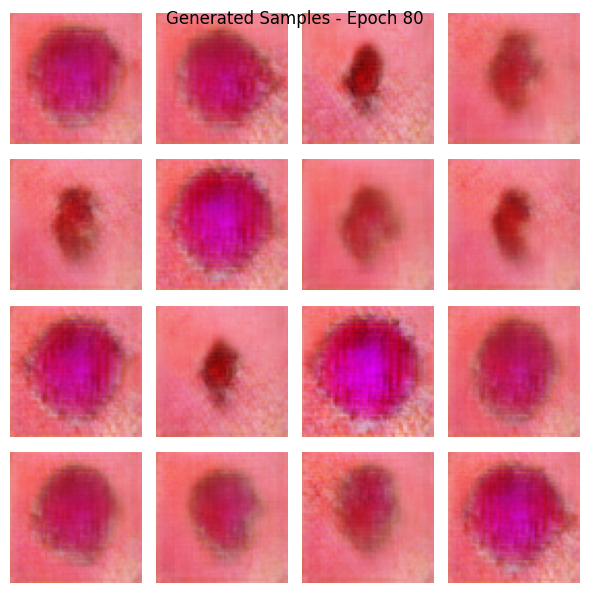

[81/90] D loss: 0.5555 | G loss: 0.5377
[82/90] D loss: 0.5539 | G loss: 0.5363
[83/90] D loss: 0.5525 | G loss: 0.5347
[84/90] D loss: 0.5519 | G loss: 0.5346
[85/90] D loss: 0.5517 | G loss: 0.5350


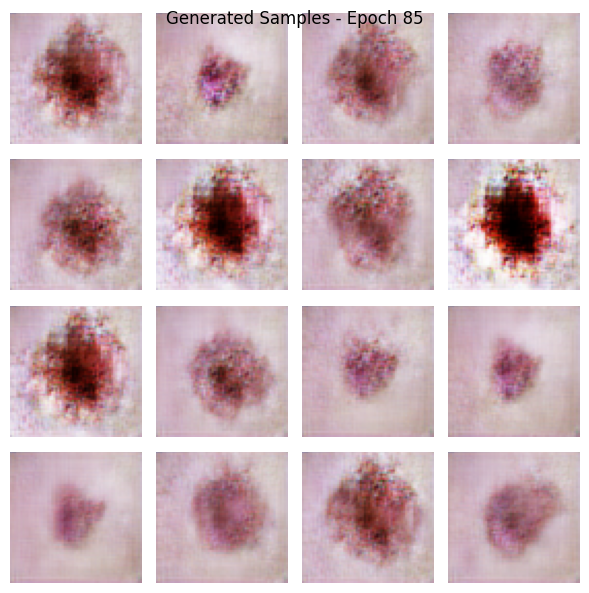

[86/90] D loss: 0.5514 | G loss: 0.5357
[87/90] D loss: 0.5499 | G loss: 0.5340
[88/90] D loss: 0.5493 | G loss: 0.5333
[89/90] D loss: 0.5490 | G loss: 0.5338
[90/90] D loss: 0.5489 | G loss: 0.5342


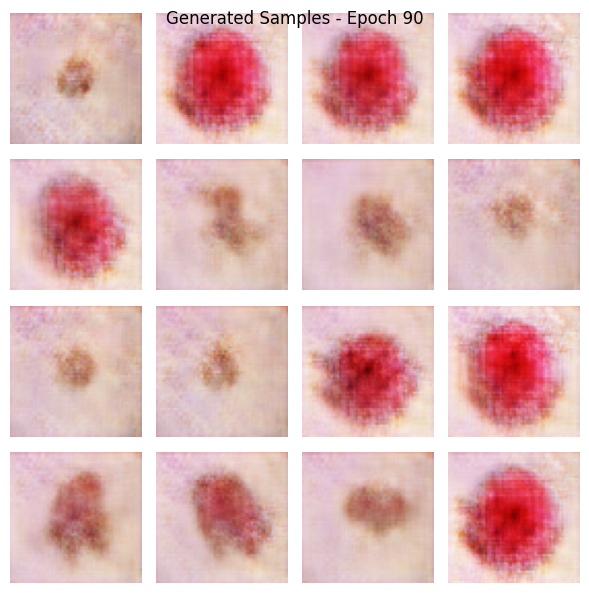

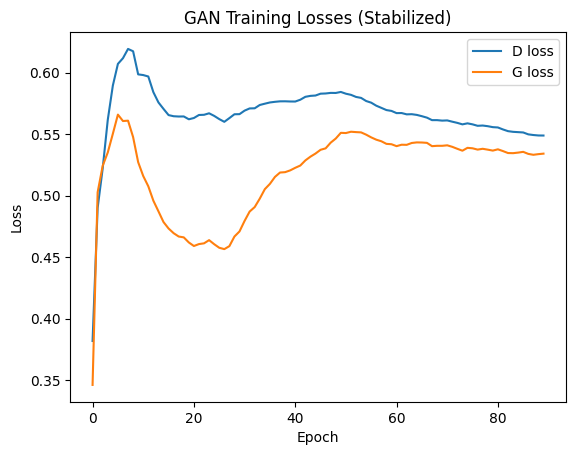

In [5]:
# ==========================================
# 3. TRAIN DCGAN USING REAL HAM IMAGES (STABILIZED)
# ==========================================

# real HAM images in [-1, 1]
X_train_gan = (X_train * 2.0) - 1.0

train_dataset = (
    tf.data.Dataset.from_tensor_slices(X_train_gan)
    .shuffle(4096)
    .batch(BATCH_SIZE, drop_remainder=True)
)

def plot_generated_images(epoch, n=16):
    noise = np.random.normal(0, 1, (n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = (gen_imgs + 1) / 2.0  # back to [0,1]

    fig = plt.figure(figsize=(6, 6))
    for i in range(n):
        plt.subplot(4, 4, i + 1)
        plt.imshow(np.clip(gen_imgs[i], 0, 1))
        plt.axis("off")
    fig.tight_layout()
    fig.suptitle(f"Generated Samples - Epoch {epoch}")
    plt.show()

    return fig, gen_imgs

def train_gan(epochs=EPOCHS_GAN):
    d_losses = []
    g_losses = []

    for epoch in range(1, epochs + 1):
        for real_imgs in train_dataset:
            batch_size = real_imgs.shape[0]

            # ------- Label smoothing + noise -------
            real_target = 0.9 + 0.05 * np.random.randn(batch_size, 1)
            fake_target = 0.1 + 0.05 * np.random.randn(batch_size, 1)

            real_target = np.clip(real_target, 0.0, 1.0).astype("float32")
            fake_target = np.clip(fake_target, 0.0, 1.0).astype("float32")

            # ------- Instance noise on images -------
            real_noisy = real_imgs + tf.random.normal(tf.shape(real_imgs), stddev=0.05)
            real_noisy = tf.clip_by_value(real_noisy, -1.0, 1.0)

            noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
            fake_imgs = generator.predict(noise, verbose=0)
            fake_noisy = fake_imgs + tf.random.normal(tf.shape(fake_imgs), stddev=0.05)
            fake_noisy = tf.clip_by_value(fake_noisy, -1.0, 1.0)

            # ------- Train Discriminator -------
            discriminator.trainable = True
            d_loss_real = discriminator.train_on_batch(real_noisy, real_target)
            d_loss_fake = discriminator.train_on_batch(fake_noisy, fake_target)
            d_loss = 0.5 * (d_loss_real[0] + d_loss_fake[0])

            # ------- Train Generator (2 steps) -------
            discriminator.trainable = False
            for _ in range(2):
                noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
                g_loss = gan.train_on_batch(
                    noise,
                    np.ones((batch_size, 1), dtype=np.float32) * 0.9
                )

        d_losses.append(d_loss)
        g_losses.append(g_loss)

        print(f"[{epoch}/{epochs}] D loss: {d_loss:.4f} | G loss: {g_loss:.4f}")

        # ---- visualize + SAVE (overwrite) every few epochs ----
        if epoch == 1 or epoch % 5 == 0:
            fig, gen_imgs = plot_generated_images(epoch)

            # Save 4x4 grid – always overwrite same file
            os.makedirs("gan_progress", exist_ok=True)
            fig.savefig("gan_progress/grid_latest.png")
            plt.close(fig)

            # Save each sample – overwrite same filenames each time
            os.makedirs("gan_samples", exist_ok=True)
            for i, img in enumerate(gen_imgs):
                out_path = f"gan_samples/sample_{i}.png"
                plt.imsave(out_path, np.clip(img, 0, 1))

    # Plot loss curves
    plt.figure()
    plt.plot(d_losses, label="D loss")
    plt.plot(g_losses, label="G loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("GAN Training Losses (Stabilized)")
    plt.show()

train_gan()


Synthetic images shape: (2100, 64, 64, 3)
Synthetic labels shape: (2100,)


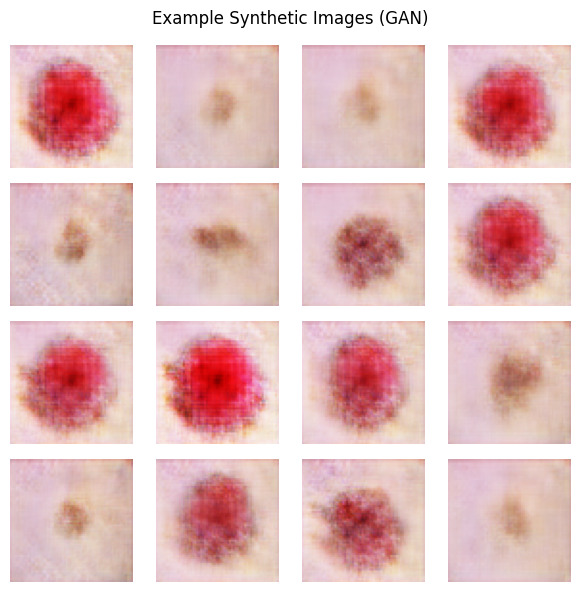

In [9]:
# ==========================================
# 4. GENERATE SYNTHETIC IMAGES (UNCONDITIONAL GAN)
# ==========================================

import os

# how many synthetic samples TOTAL
total_synth = N_SYNTH_PER_CLASS * num_classes

# sample noise
noise = np.random.normal(0, 1, (total_synth, LATENT_DIM))

# generate with the generator
synth_imgs = generator.predict(noise, verbose=0)   # shape (total_synth, 64, 64, 3)
synth_imgs = (synth_imgs + 1) / 2.0                # [-1,1] -> [0,1]

print("Synthetic images shape:", synth_imgs.shape)

# sample labels from the training distribution
synth_labels = np.random.choice(y_train, size=total_synth, replace=True)
print("Synthetic labels shape:", synth_labels.shape)

# ---- quick visualization of first 16 synthetic images ----
plt.figure(figsize=(6, 6))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(np.clip(synth_imgs[i], 0, 1))
    plt.axis("off")
plt.suptitle("Example Synthetic Images (GAN)")
plt.tight_layout()
plt.show()

# ---- save to disk (overwrites on rerun) ----
out_dir = "gan_samples"
os.makedirs(out_dir, exist_ok=True)

for idx, img in enumerate(synth_imgs):
    # same filenames each run -> overwrite instead of making duplicates
    fname = f"synth_{idx:05d}.png"
    plt.imsave(os.path.join(out_dir, fname), np.clip(img, 0, 1))

# optional: save arrays for later reuse
np.save("synthetic_images.npy", synth_imgs)
np.save("synthetic_labels.npy", synth_labels)


In [10]:
# ==========================================
# 5. BUILD CNN CLASSIFIER
# ==========================================
def build_classifier(input_shape=IMG_SHAPE, num_classes=num_classes):
    model = models.Sequential(name="CNN_Classifier")
    model.add(layers.Input(shape=input_shape))

    model.add(layers.Conv2D(32, (3,3), activation="relu", padding="same"))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation="relu"))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation="softmax"))

    model.compile(
        optimizer=optimizers.Adam(learning_rate=LR_CNN),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


Model: "CNN_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,142,855 (4.36 MB)

 Trainable params: 1,142,855 (4.36 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - accuracy: 0.6360 - loss: 1.2882 - val_accuracy: 0.6695 - val_loss: 0.9949
Epoch 2/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6643 - loss: 1.0241 - val_accuracy: 0.6711 - val_loss: 0.9157
Epoch 3/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6765 - loss: 0.9157 - val_accuracy: 0.6852 - val_loss: 0.8674
Epoch 4/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6798 - loss: 0.8766 - val_accuracy: 0.7189 - val_loss: 0.8242
Epoch 5/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6918 - loss: 0.8392 - val_accuracy: 0.7212 - val_loss: 0.7800
Epoch 6/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7021 - loss: 0.7971 - val_accuracy: 0.7345 - val_loss: 0.7610
Epoch 7/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7107 - loss: 0.7871 - val_accuracy: 0.7110 - val_loss: 0.7452
Epoch 8/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7274 - loss: 0.7321 - val_accu

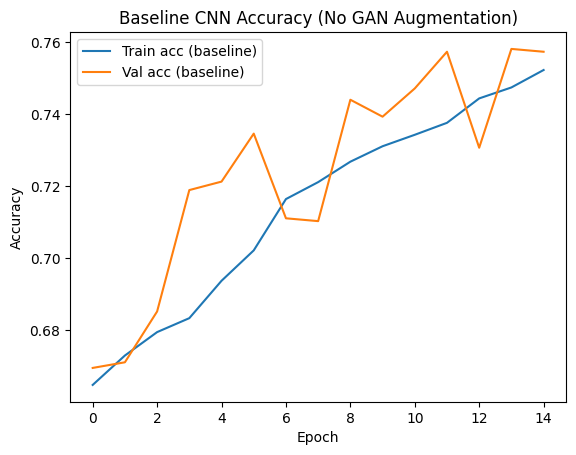

In [16]:
# ==========================================
# 6. BASELINE CNN: TRAIN ONLY ON REAL DATA
# ==========================================
cnn_baseline = build_classifier()
cnn_baseline.summary()

history_baseline = cnn_baseline.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=EPOCHS_CNN,
    batch_size=BATCH_SIZE,
    verbose=1
)

test_loss_base, test_acc_base = cnn_baseline.evaluate(X_test, y_test, verbose=0)
print(f"Baseline test accuracy (no GAN augmentation): {test_acc_base:.4f}")

plt.figure()
plt.plot(history_baseline.history["accuracy"],     label="Train acc (baseline)")
plt.plot(history_baseline.history["val_accuracy"], label="Val acc (baseline)")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Baseline CNN Accuracy (No GAN Augmentation)")
plt.show()


Augmented train shape: (9335, 64, 64, 3) (9335,)


Model: "CNN_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)              │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,142,855 (4.36 MB)

 Trainable params: 1,142,855 (4.36 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - accuracy: 0.6484 - loss: 1.2144 - val_accuracy: 0.6695 - val_loss: 0.9976
Epoch 2/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.6683 - loss: 1.0569 - val_accuracy: 0.6695 - val_loss: 0.8945
Epoch 3/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6816 - loss: 0.9692 - val_accuracy: 0.6735 - val_loss: 0.8632
Epoch 4/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6800 - loss: 0.9494 - val_accuracy: 0.6774 - val_loss: 0.8374
Epoch 5/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6801 - loss: 0.9234 - val_accuracy: 0.6899 - val_loss: 0.8177
Epoch 6/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6885 - loss: 0.8937 - val_accuracy: 0.6938 - val_loss: 0.7832
Epoch 7/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6975 - loss: 0.8810 - val_accuracy: 0.7056 - val_loss: 0.7658
Epoch 8/15
146/146 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6976 - loss: 0.8785 - val_accu

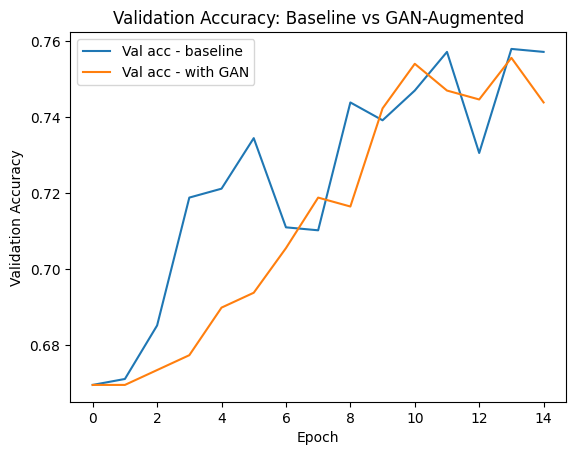

Baseline test acc: 0.7405189871788025
GAN-augmented test acc: 0.7318695783615112


In [17]:
# ==========================================
# 7. CNN WITH GAN AUGMENTATION
# ==========================================
# Concatenate synthetic images to the real training set
X_train_aug = np.concatenate([X_train, synth_imgs], axis=0)
y_train_aug = np.concatenate([y_train, synth_labels], axis=0)

print("Augmented train shape:", X_train_aug.shape, y_train_aug.shape)

cnn_aug = build_classifier()
cnn_aug.summary()

history_aug = cnn_aug.fit(
    X_train_aug, y_train_aug,
    validation_data=(X_val, y_val),
    epochs=EPOCHS_CNN,
    batch_size=BATCH_SIZE,
    verbose=1
)

test_loss_aug, test_acc_aug = cnn_aug.evaluate(X_test, y_test, verbose=0)
print(f"Augmented test accuracy (with GAN images): {test_acc_aug:.4f}")

# Compare curves
plt.figure()
plt.plot(history_baseline.history["val_accuracy"], label="Val acc - baseline")
plt.plot(history_aug.history["val_accuracy"], label="Val acc - with GAN")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.legend()
plt.title("Validation Accuracy: Baseline vs GAN-Augmented")
plt.show()

print("Baseline test acc:", test_acc_base)
print("GAN-augmented test acc:", test_acc_aug)



========== FINAL EVALUATION ==========
Baseline Test Accuracy:       0.7405
GAN-Augmented Test Accuracy:  0.7319
Test set size:                1503 samples
Relative Improvement (GAN vs Baseline): -0.86%

Full Metric Breakdown:
Baseline CNN -> Test loss: 0.7135, Test acc: 0.7405
GAN-Augmented CNN -> Test loss: 0.7183, Test acc: 0.7319


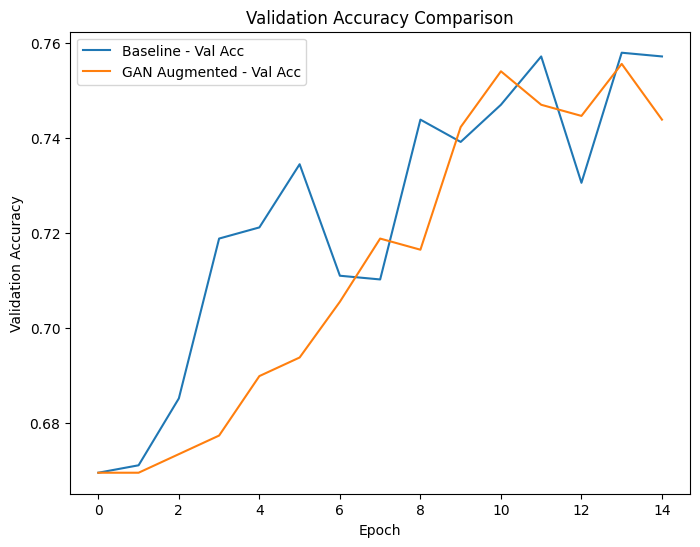

In [18]:
# ==========================================
# 8. EVALUATION METRICS & COMPARISON
# ==========================================

print("\n========== FINAL EVALUATION ==========")
print(f"Baseline Test Accuracy:       {test_acc_base:.4f}")
print(f"GAN-Augmented Test Accuracy:  {test_acc_aug:.4f}")
print(f"Test set size:                {len(X_test)} samples")

# Relative improvement of GAN vs baseline
improvement = (test_acc_aug - test_acc_base) * 100
print(f"Relative Improvement (GAN vs Baseline): {improvement:.2f}%")

# Individual evaluations (loss + accuracy)
baseline_results = cnn_baseline.evaluate(X_test, y_test, verbose=0)
gan_results      = cnn_aug.evaluate(X_test, y_test, verbose=0)

print("\nFull Metric Breakdown:")
print(f"Baseline CNN -> Test loss: {baseline_results[0]:.4f}, Test acc: {baseline_results[1]:.4f}")
print(f"GAN-Augmented CNN -> Test loss: {gan_results[0]:.4f}, Test acc: {gan_results[1]:.4f}")

# Validation accuracy curves
plt.figure(figsize=(8, 6))
plt.plot(history_baseline.history['val_accuracy'], label='Baseline - Val Acc')
plt.plot(history_aug.history['val_accuracy'], label='GAN Augmented - Val Acc')
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.title("Validation Accuracy Comparison")
plt.legend()
plt.show()


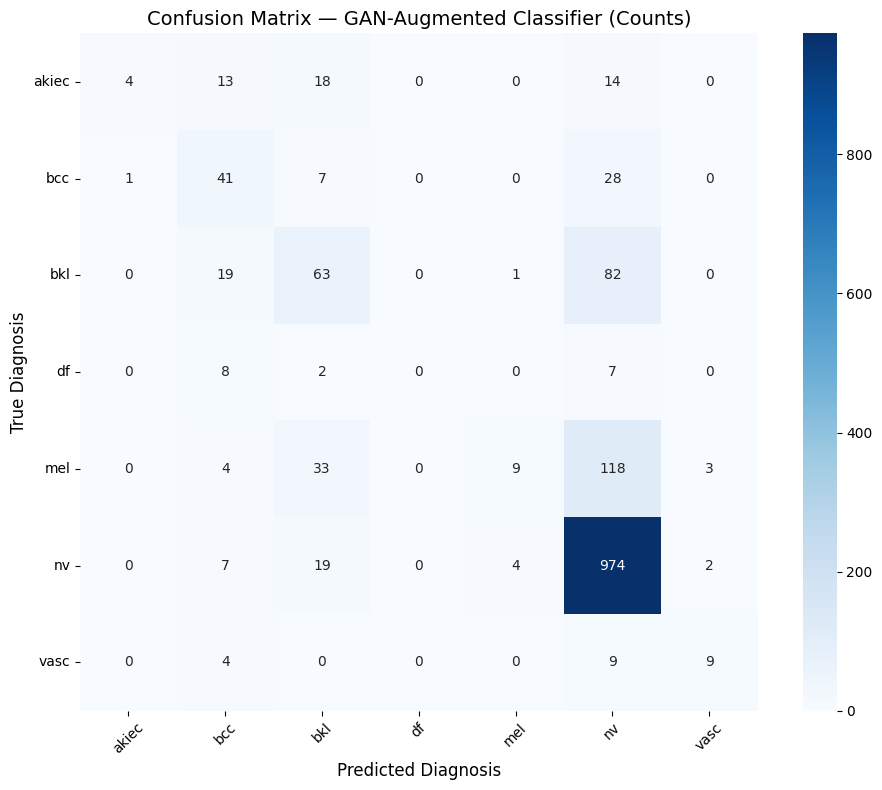

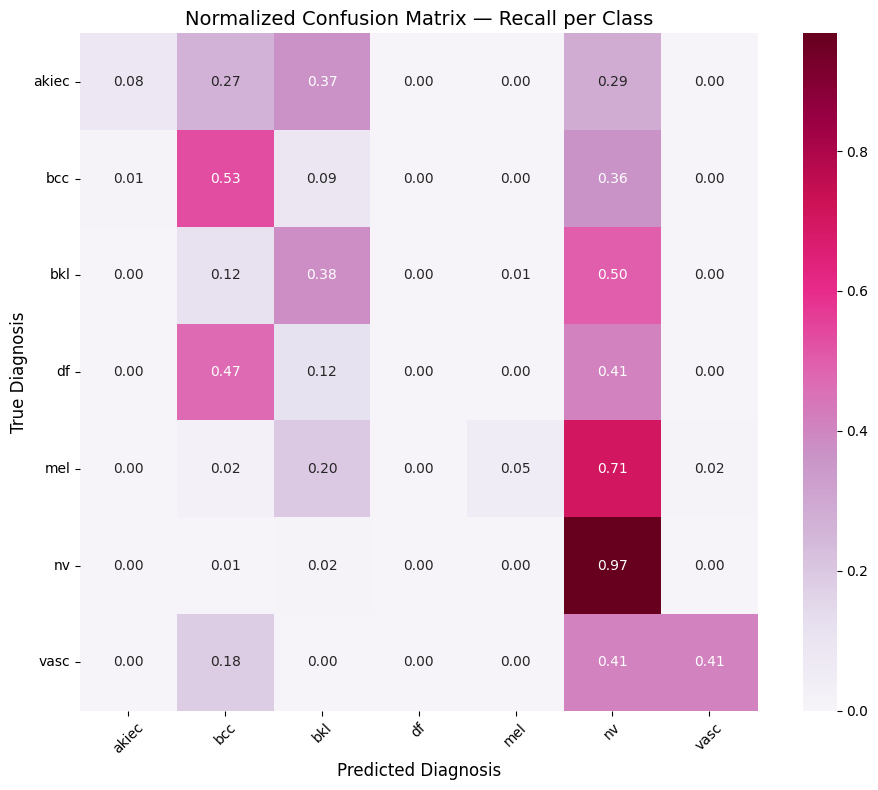

In [20]:
# ==========================================
# Confusion Matrix — Human Readable
# ==========================================

class_names = [
    "akiec", "bcc", "bkl", "df", "mel", "nv", "vasc"
]

# raw counts
cm = confusion_matrix(y_test, preds)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    square=True,
)
plt.title("Confusion Matrix — GAN-Augmented Classifier (Counts)", fontsize=14)
plt.ylabel("True Diagnosis", fontsize=12)
plt.xlabel("Predicted Diagnosis", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# normalized
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm_norm,
    annot=True,
    fmt=".2f",
    cmap="PuRd",
    xticklabels=class_names,
    yticklabels=class_names,
    square=True,
)
plt.title("Normalized Confusion Matrix — Recall per Class", fontsize=14)
plt.ylabel("True Diagnosis", fontsize=12)
plt.xlabel("Predicted Diagnosis", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [21]:
from sklearn.metrics import roc_auc_score

# Make sure pred_probs = model.predict(X_test)
# y_test must be the numeric label indices

auc_macro = roc_auc_score(
    y_test,
    pred_probs,
    multi_class="ovr",
    average="macro"
)

print("\n⭐ Macro AUC (One-vs-Rest):", round(auc_macro, 4))



⭐ Macro AUC (One-vs-Rest): 0.9129
